In [1]:
# Import Libraries
import pandas as pd 
import matplotlib.pyplot as plt
import folium

In [3]:
df = pd.read_csv('./Dataset .csv')
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [19]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Price range', 'Aggregate rating',
       'Rating color', 'Rating text', 'Votes', 'Cluster'],
      dtype='object')

### Objective: Perform a geographical analysis of the restaurants in the dataset.
 
Steps:

- Explore the latitude and longitude coordinates of the restaurants and visualize their distribution on a map.
- Group the restaurants by city or locality and analyze the concentration of restaurants in different areas.
- Calculate statistics such as the average ratings, cuisines, or price ranges by city or locality.
- Identify any interesting insights or patterns related to the locations of the restaurants.


In [17]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Cluster'],
      dtype='object')

In [20]:
import folium

# Calculate the central point of the locations (mean latitude and longitude)
center_lat = df['Latitude'].mean()
center_lon = df['Longitude'].mean()

# Create a map centered around the calculated central point
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Add points to the map
for i, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}<br>{row['Address']}<br>Rating: {row['Aggregate rating']}",
        tooltip=row['Restaurant Name']
    ).add_to(m)

# Save map to HTML file
m.save('restaurants_map.html')

# Display the map if running in a Jupyter notebook
m


In [18]:
# Dropping unneccary columns
df = df.drop(['Currency','Has Table booking','Has Online delivery','Is delivering now','Switch to order menu'],axis=1)

In [4]:
grouped_by_city = df.groupby('City')

In [5]:
restaurant_count = grouped_by_city['Restaurant Name'].count()

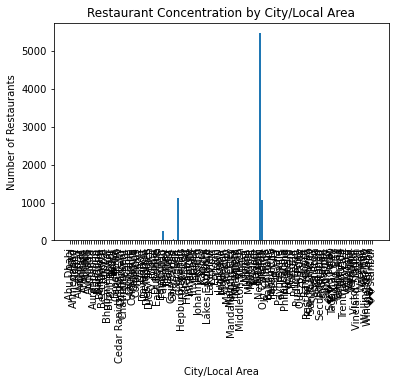

In [6]:
plt.bar(restaurant_count.index, restaurant_count.values) 
plt.xlabel('City/Local Area') 
plt.ylabel('Number of Restaurants') 
plt.title('Restaurant Concentration by City/Local Area') 
plt.xticks(rotation=90) 
plt.show()

In [7]:
from sklearn.cluster import KMeans 

X = df[['Latitude', 'Longitude']] 
k = 5 
kmeans = KMeans(n_clusters=k, random_state=0) 
cluster_labels = kmeans.fit_predict(X) 
df['Cluster'] = cluster_labels

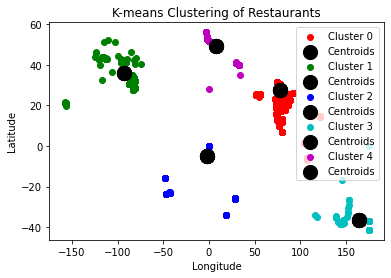

In [8]:
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k'] 

for cluster_num in range(k): 
    cluster_data = df[df['Cluster'] == cluster_num] 
    plt.scatter(cluster_data['Longitude'], cluster_data['Latitude'], 
                c=colors[cluster_num], label=f'Cluster {cluster_num}') 
    plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0], 
                s=200, c='black', label='Centroids') 
    plt.xlabel('Longitude') 
    plt.ylabel('Latitude') 
    plt.title('K-means Clustering of Restaurants') 
    plt.legend() 
plt.show()

In [9]:
average_ratings_by_city = grouped_by_city['Aggregate rating'].mean() 
print(average_ratings_by_city)

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64


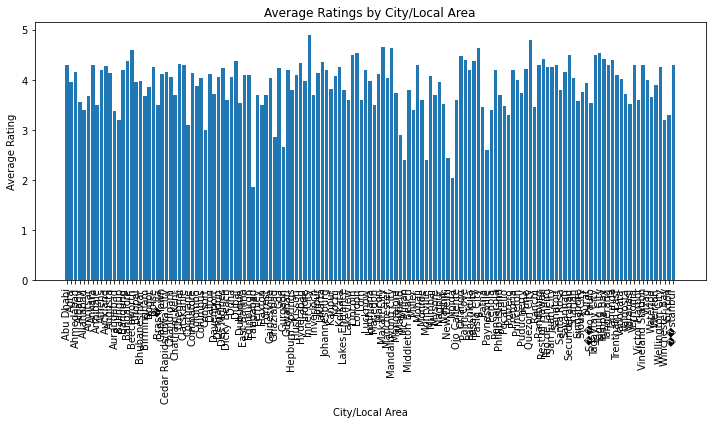

In [10]:
plt.figure(figsize=(10, 6)) 

plt.bar(average_ratings_by_city.index, average_ratings_by_city.values) 
plt.xlabel('City/Local Area') 
plt.ylabel('Average Rating') 
plt.title('Average Ratings by City/Local Area') 
plt.xticks(rotation=90) # Rotate x-axis labels for better readability 
plt.tight_layout() 
plt.show()

In [11]:
popular_cuisines_by_city = grouped_by_city['Cuisines'].agg(lambda x: x.mode().tolist()) 
print(popular_cuisines_by_city)

City
Abu Dhabi                         [American, Indian, Italian, Pizza]
Agra                                         [North Indian, Mughlai]
Ahmedabad          [Cafe, American, Continental, Armenian, Fast F...
Albany                                      [Japanese, Steak, Sushi]
Allahabad                                    [North Indian, Chinese]
                                         ...                        
Weirton                                    [Burger, Greek, Sandwich]
Wellington City                                               [Cafe]
Winchester Bay                              [Burger, Seafood, Steak]
Yorkton                                                      [Asian]
��stanbul                                                     [Cafe]
Name: Cuisines, Length: 141, dtype: object


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13740\3718216243.py:9: UserWarning: Tight layout not applied. The left and 

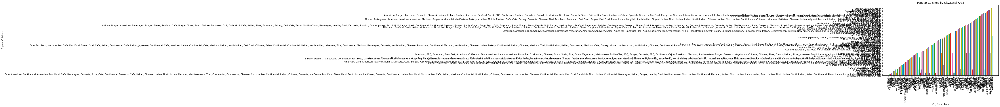

In [12]:
plt.figure(figsize=(10, 6)) 

for city, cuisines in popular_cuisines_by_city.items(): 
    plt.bar(city, ', '.join(cuisines)) 
    plt.xlabel('City/Local Area') 
    plt.ylabel('Popular Cuisines') 
    plt.title('Popular Cuisines by City/Local Area') 
    plt.xticks(rotation=90) # Rotate x-axis labels for better readability 
    plt.tight_layout()  
    
plt.show()

In [13]:
common_price_range_by_city = grouped_by_city['Price range'].agg(lambda x: x.mode().iloc[0]) 
print(common_price_range_by_city)

City
Abu Dhabi          4
Agra               2
Ahmedabad          3
Albany             1
Allahabad          3
                  ..
Weirton            2
Wellington City    4
Winchester Bay     2
Yorkton            2
��stanbul          3
Name: Price range, Length: 141, dtype: int64


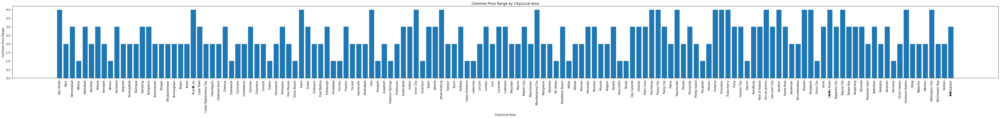

In [14]:
plt.figure(figsize=(50, 6)) 

plt.bar(common_price_range_by_city.index, common_price_range_by_city.values) 
plt.xlabel('City/Local Area') 
plt.ylabel('Common Price Range') 
plt.title('Common Price Range by City/Local Area') 
plt.xticks(rotation=90) 
plt.tight_layout() 
plt.show()

In [15]:
grouped_by_city = df.groupby('City') 
cuisine_diversity = grouped_by_city['Cuisines'].apply(lambda x: len(set(x))) 
print(cuisine_diversity)

City
Abu Dhabi          17
Agra               15
Ahmedabad          21
Albany             17
Allahabad          18
                   ..
Weirton             1
Wellington City    17
Winchester Bay      1
Yorkton             1
��stanbul          11
Name: Cuisines, Length: 141, dtype: int64


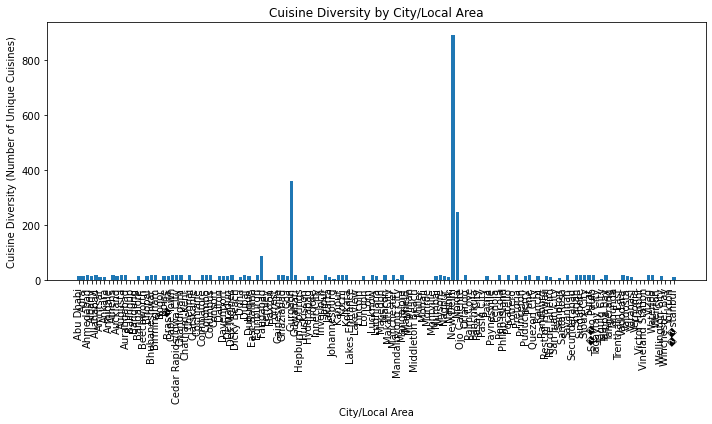

In [16]:
plt.figure(figsize=(10, 6)) 

plt.bar(cuisine_diversity.index, cuisine_diversity.values) 
plt.xlabel('City/Local Area') 
plt.ylabel('Cuisine Diversity (Number of Unique Cuisines)') 
plt.title('Cuisine Diversity by City/Local Area') 
plt.xticks(rotation=90) 
plt.tight_layout() 
plt.show()